In [139]:
# Install OWS:
# In a terminal, run: 
#      pip install datacube-ows
#
# For persistent install see: https://datacube-ows.readthedocs.io/en/latest/styling_howto_jupyter.html

from datacube_ows.styles.api import *

# For API documentation see: https://datacube-ows.readthedocs.io/en/latest/cfg_style_api.html
# This workshop is based on the styling HOWTO at: https://datacube-ows.readthedocs.io/en/latest/styling_howto.html

In [170]:
#  Fetch some multiband data

from datacube import Datacube
dc = Datacube()
data = dc.load(
    product='gm_s2_annual',
    measurements=['red', 'green', 'blue', "nir", "swir_1", "swir_2"],
    latitude=(0.5, 6.5),
    longitude=(35, 46.0),
    time=('2020-01', '2020-01'),
    output_crs="EPSG:6933",
    resolution=(-1000,1000)
)

/home/jovyan/.envs/odc/lib/python3.6/site-packages/datacube/drivers/postgres/_connections.py:87: SADeprecationWarning: Calling URL() directly is deprecated and will be disabled in a future release.  The public constructor for URL is now the URL.create() method.
  username=username, password=password,


In [161]:
# A simple RGB style - as used in DEAfrica config
rgb_cfg = {
    "components": {
        "red": {"red": 1.0},
        "green": {"green": 1.0},
        "blue": {"blue": 1.0},
    },
    "scale_range": (0, 3000),
}

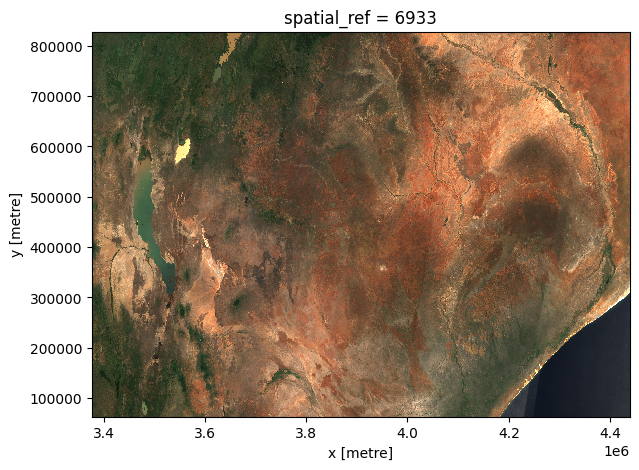

In [164]:
# Plot image:
plot_image_with_style_cfg(rgb_cfg, data, size=5)

# Save image as PNG:
with open("rgb_image.png", "wb") as fp:
    fp.write(xarray_image_as_png(apply_ows_style_cfg(rgb_cfg, data)))

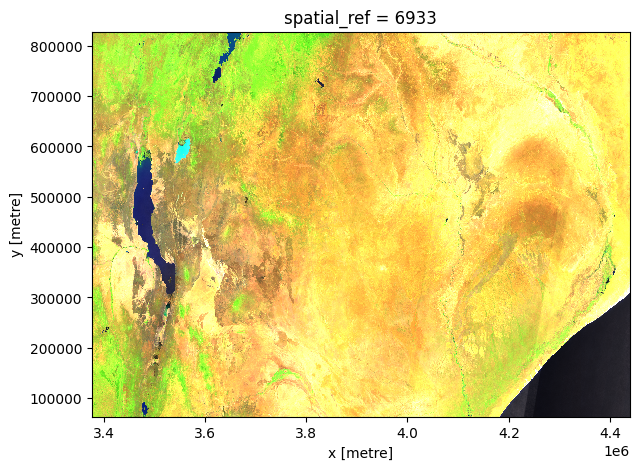

In [169]:
# A false-colour example from DE Africa config
ir_green_cfg = {
    "components": {
        "red": {
            "swir_1": 1.0
        },
        "green": {
            "nir": 1.0
        },
        "blue": {
            "green": 1.0
        },
    },
    "scale_range": (0, 3000),
}
plot_image_with_style_cfg(ir_green_cfg, data, size=5)

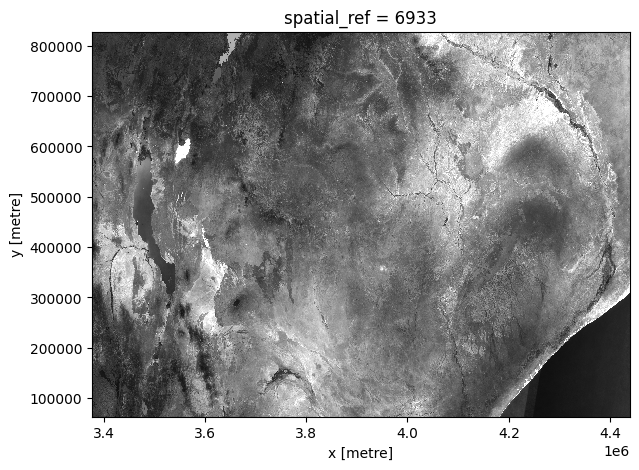

In [173]:
# Single band example - from DE Africa config
pure_red_cfg = {
    "components": {
        "red": {
         "red": 1.0
        },
        "green": {
         "red": 1.0
        },
        "blue": {
         "red": 1.0
        },
    },
    "scale_range": (0, 3000),
}
plot_image_with_style_cfg(pure_red_cfg, data, size=5)

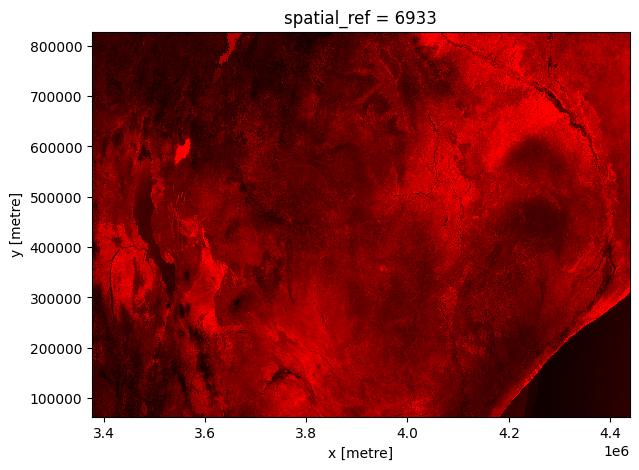

In [174]:
# Single channel example.
very_red_cfg = {
    "components": {
        "red": {
            "red": 1.0
        },
        "green": {},
        "blue": {},
    },
    "scale_range": (0, 3000),
}
plot_image_with_style_cfg(very_red_cfg, data, size=5)

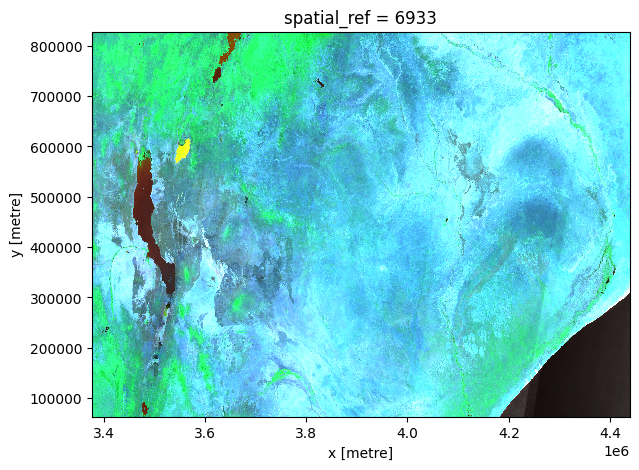

In [178]:
# Band mixing example
multiband_cfg = {
    "components": {
        "red": {
            # Weighting factors should sum to (close to) 1.0
            # 0.333 + 0.333 + 0.333 = 0.999 ~ 1.0
            "red": 0.333,
            "green": 0.333,
            "blue": 0.333,
        },
        "green": {
            # Weighting factors should sum to (close to) 1.0
            # So use 1.0 for a single band.
            "nir": 1.0
        },
        "blue": {
            # Weighting factors should sum to (close to) 1.0
            # 0.5 + 0.5 = 1.0
            "swir_1": 0.5,
            "swir_2": 0.5,
        },
    },
    "scale_range": (0, 3000),
}
plot_image_with_style_cfg(multiband_cfg, data, size=5)

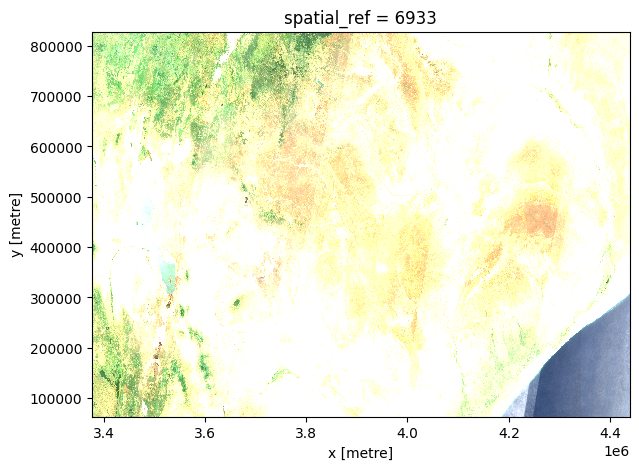

In [179]:
rgb_low_scalerange_cfg = {
    "components": {
        "red": {"red": 1.0},
        "green": {"green": 1.0},
        "blue": {"blue": 1.0},
    },
    # Originally : (0, 3000),
    "scale_range": (0, 800),
}

plot_image_with_style_cfg(rgb_low_scalerange_cfg, data, size=5)


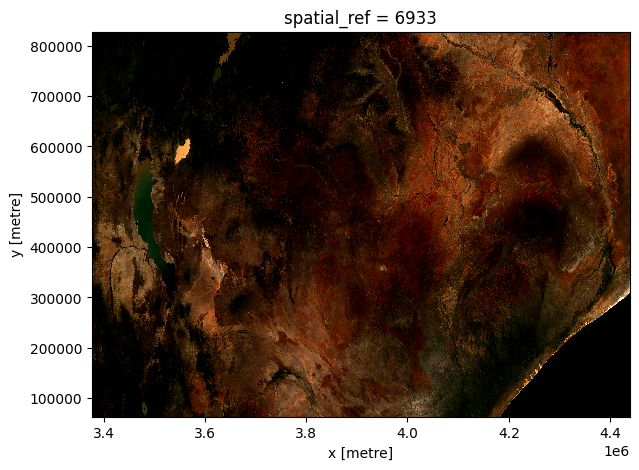

In [180]:
rgb_high_scalerange_cfg = {
    "components": {
        "red": {"red": 1.0},
        "green": {"green": 1.0},
        "blue": {"blue": 1.0},
    },
    # Originally : (0, 3000),
    "scale_range": (800, 4000),
}

plot_image_with_style_cfg(rgb_high_scalerange_cfg, data, size=5)

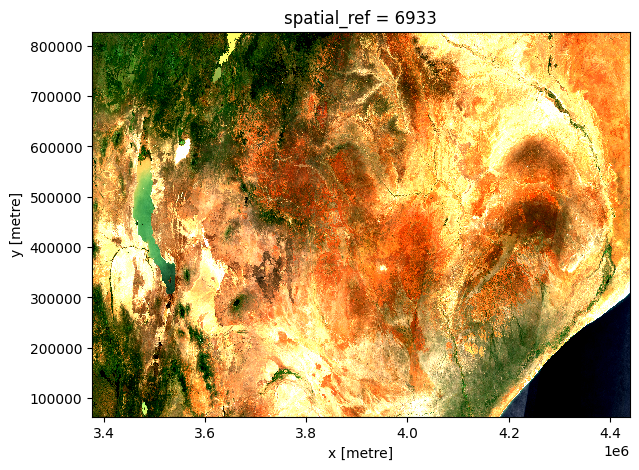

In [182]:
rgb_narrow_scale_rng_cfg = {
    "components": {
        "red": {"red": 1.0},
        "green": {"green": 1.0},
        "blue": {"blue": 1.0},
    },
     # Originally : (0, 3000),
    "scale_range": (500, 1500),
}

plot_image_with_style_cfg(rgb_narrow_scale_rng_cfg, data, size=5)

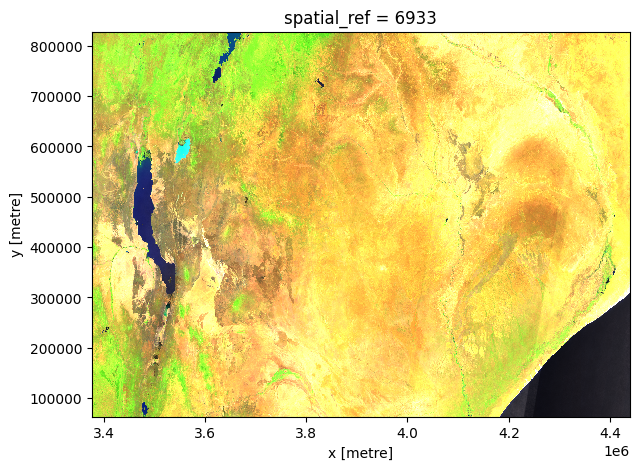

In [183]:
ir_green_cfg = {
    "components": {
        "red": {
            "swir_1": 1.0
        },
        "green": {
            "nir": 1.0
        },
        "blue": {
            "green": 1.0
        },
    },
    "scale_range": (0, 3000),
}

plot_image_with_style_cfg(ir_green_cfg, data, size=5)

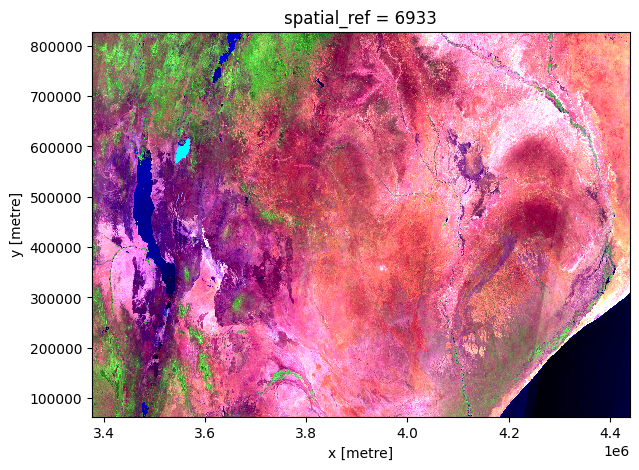

In [186]:
# Per-channel scaling
irg_bandscale_cfg = {
    "components": {
        "red": {
            "swir_1": 1.0,
            "scale_range": (800, 3700),
        },
        "green": {
            "nir": 1.0,
            "scale_range": (1600, 3900),
        },
        "blue": {
            "green": 1.0
        },
    },
    "scale_range": (200, 1900),
}
plot_image_with_style_cfg(irg_bandscale_cfg, data, size=5)

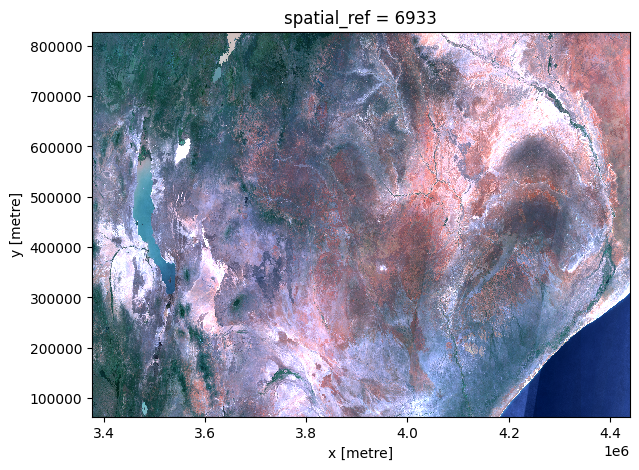

In [187]:
# Per band scaling with RGB - a cautionary tale.
rgb_bandscale_cfg = {
    "components": {
        "red": {
            "red": 1.0,
            "scale_range": (200, 2500),
        },
        "green": {
            "green": 1.0,
            "scale_range": (100, 2000),
        },
        "blue": {
            "blue": 1.0,
            "scale_range": (50, 1200),
        },
    },
    # "scale_range": (50, 3000),
}

plot_image_with_style_cfg(rgb_bandscale_cfg, data, size=5)

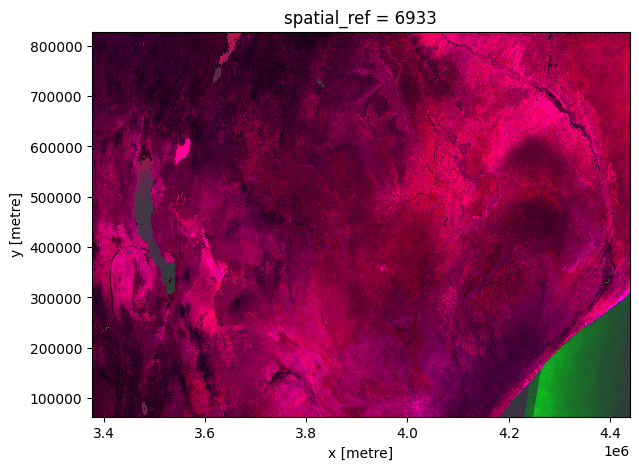

In [188]:
# A bad, but hopefully educational example.
def naive_ndvi(data):
    # Returns data in range (-1, 1)
    return (data["nir"] - data["red"]) / (data["nir"] + data["red"])

r_naive_b_cfg = {
    "components": {
        "red": {"red": 1.0},
        "green": naive_ndvi, 
        "blue": {"blue": 1.0},
    },
    "scale_range": [0, 3000]
}
plot_image_with_style_cfg(r_naive_b_cfg, data, size=5)

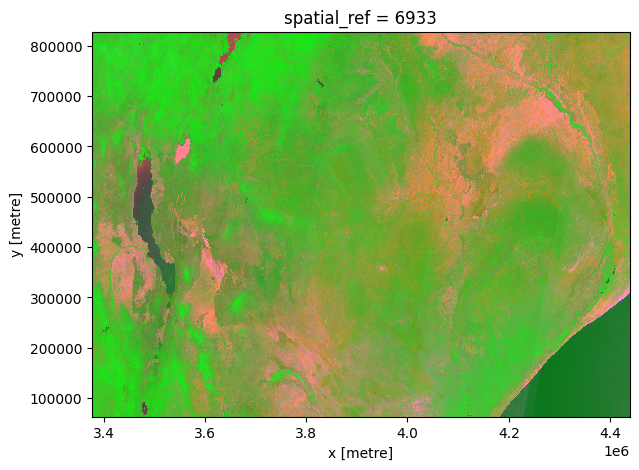

In [190]:
# Scaling, the hard way.
def full_scaled_ndvi(data):
    # Raw index in range (-1, 1)
    unscaled = (data["nir"] - 1.0 * data["red"]) / (data["nir"] + data["red"])
    # Return full raw index range scaled to 0-255
    return ((unscaled + 1) * 255/2).clip(0,255)

r_fullscaled_b_cfg = {
    "components": {
        "red": {"red": 1.0},
        "green": full_scaled_ndvi, 
        "blue": {"blue": 1.0},
    },
    "scale_range": [0, 3000]
}
plot_image_with_style_cfg(r_fullscaled_b_cfg, data, size=5)

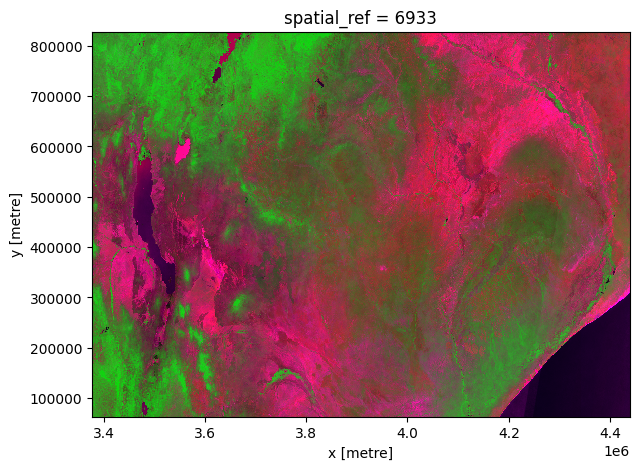

In [191]:
# Scaling, the easy way.
@scalable
def scalable_ndvi(data):
    # Return the raw index - decorator handles scaling
    return (1.0 * data["nir"] - 1.0 * data["red"]) / (data["nir"] + data["red"])


r_halfscale_b_cfg = {
    "components": {
        "red": {"red": 1.0},
        "green": {
            "function": scalable_ndvi,
            "kwargs": {
                "scale_from": [0.0, 1.0],
                "scale_to": [0, 255]
            },
        },
        "blue": {"blue": 1.0},
    },
    "scale_range": [0, 3000]
}
plot_image_with_style_cfg(r_halfscale_b_cfg, data, size=5)

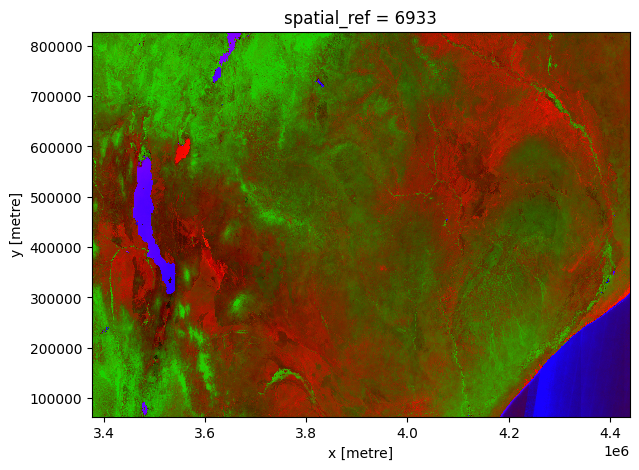

In [193]:
# Putting it all together
rgb_ndvi_ndwi_cfg = {
    "components": {
        "red": {
            "red": 0.3333,
            "green": 0.3333,
            "blue": 0.33333
        },
        "green": {
            # Pre-defined utility functions: https://datacube-ows.readthedocs.io/en/latest/cfg_functions.html#band-utils-functions
            "function": "datacube_ows.band_utils.norm_diff",
            "kwargs": {
                "band1": "nir",
                "band2": "red",
                "scale_from": (0.0, 1.0),
                "scale_to": (0, 255)
            }
        },
        "blue": {
            "function": "datacube_ows.band_utils.norm_diff",
            "kwargs": {
                "band1": "green",
                "band2": "nir",
                "scale_from": (0.0, 0.2),
                "scale_to": (0, 255)
            }
        },
    },
    "scale_range": (0, 3000),
}
plot_image_with_style_cfg(rgb_ndvi_ndwi_cfg, data, size=5)

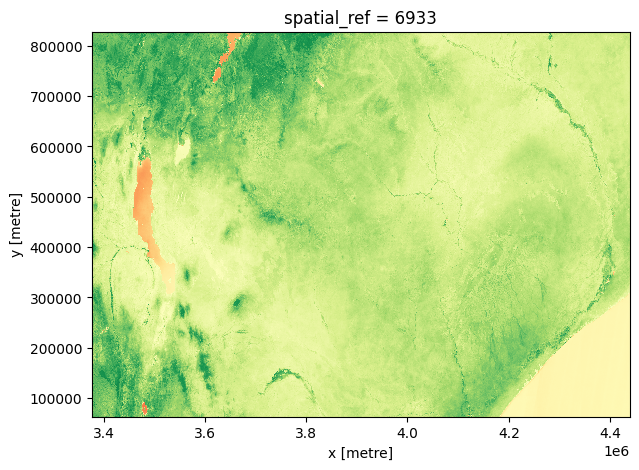

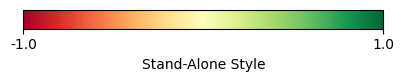

In [195]:
# Colour Ramps
ndvi_bidirection_cfg = {
    "index_function": {
        "function": "datacube_ows.band_utils.norm_diff",
        "mapped_bands": True,
        "kwargs": {"band1": "nir", "band2": "red"},
    },
    # Matplotlib named ramps: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    "mpl_ramp": "RdYlGn",
    "range": [-1.0, 1.0]
}
plot_image_with_style_cfg(ndvi_bidirection_cfg, data, size=5)

# Automatic legend generation!

legend = generate_ows_legend_style_cfg(ndvi_bidirection_cfg)

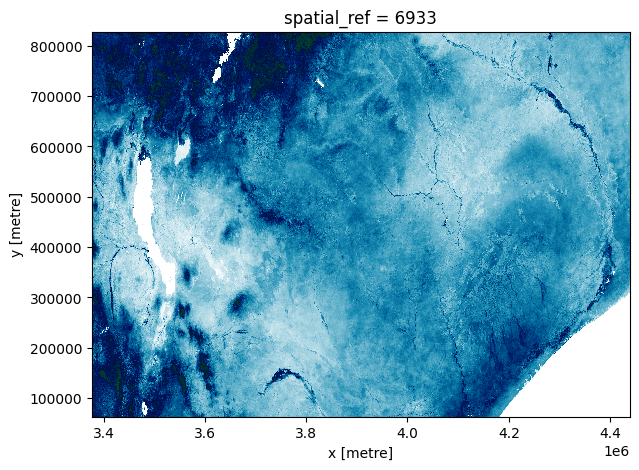

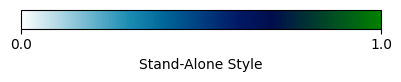

In [196]:
ndvi_unidirection_cfg = {
    "index_function": {
        "function": "datacube_ows.band_utils.norm_diff",
        "mapped_bands": True,
        "kwargs": {"band1": "nir", "band2": "red"},
    },
    # _r suffix reverses ramp direction
    "mpl_ramp": "ocean_r",
    "range": [0.0, 1.0]
}
plot_image_with_style_cfg(ndvi_unidirection_cfg, data, size=5)
legend = generate_ows_legend_style_cfg(ndvi_unidirection_cfg)

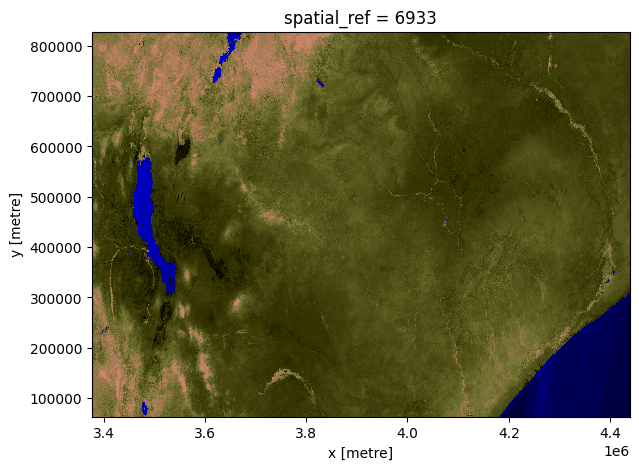

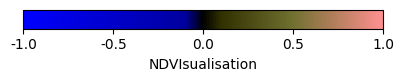

In [202]:
# Custom colour ramp
ndvi_custom_ramp_cfg = {
    "index_function": {
        "function": "datacube_ows.band_utils.norm_diff",
        "kwargs": {"band1": "nir", "band2": "red"},
    },
    "color_ramp": [
        # Negative numbers are bright blue
        {"value": -1.0, "color": "#0000FF"},
        # Fading quickly below -0.1,
        {"value": -0.1, "color": "#0000A0",},
        # Pure black at exactly zero
        {"value": 0.0, "color": "black",},
        # Brightening to a dirty yellow-green at 0.1,
        {"value": 0.1, "color": "#303000",},
        # to bright yellow at 0.5
        {"value": 0.5, "color": "#707030",},
        # then to a pinkish salmon at 1.0
        {"value": 1.0, "color": "#FF9090",},
    ],
    # Legend configuration.  See https://datacube-ows.readthedocs.io/en/latest/cfg_colourramp_styles.html#legend-configuration
    "legend": {
        "title": "NDVIsualisation",
        "begin": "-1.0",
        "end": "1.0",
        "ticks_every": "0.5"
    }
}
plot_image_with_style_cfg(ndvi_custom_ramp_cfg, data, size=5)
legend = generate_ows_legend_style_cfg(ndvi_custom_ramp_cfg)

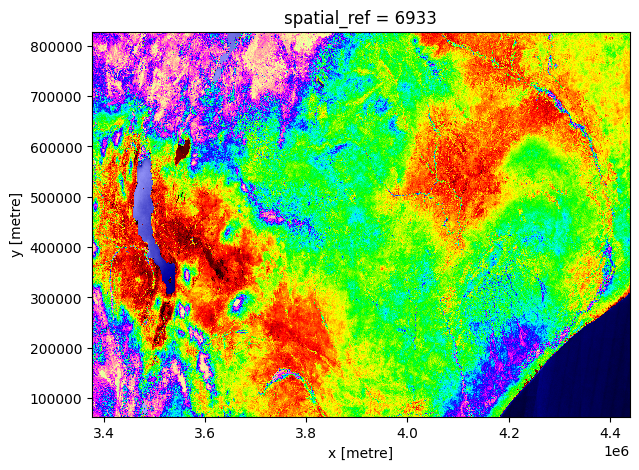

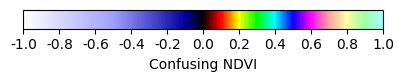

In [209]:
# Getting silly
ndvi_custom_ramp_cfg = {
    "index_function": {
        "function": "datacube_ows.band_utils.norm_diff",
        "kwargs": {"band1": "nir", "band2": "red"},
    },
    "color_ramp": [
        {"value": -1.0, "color": "#FFFFFF"},
        {"value": -0.5, "color": "#A0A0FF"},
        {"value": -0.1, "color": "#0000A0",},
        {"value": 0.0, "color": "black",},
        {"value": 0.1, "color": "#FF0000",},
        {"value": 0.2, "color": "#FFFF00",},
        {"value": 0.3, "color": "#00FF00",},
        {"value": 0.4, "color": "#00FFFF",},
        {"value": 0.5, "color": "#0000FF",},
        {"value": 0.6, "color": "#FF00FF",},
        {"value": 0.7, "color": "#FFA0A0",},
        {"value": 0.8, "color": "#FFFFA0",},
        {"value": 0.9, "color": "#A0FFA0",},
        {"value": 1.0, "color": "#A0FFFF",},
    ],
    "legend": {
        "title": "Confusing NDVI",
        "begin": "-1.0",
        "end": "1.0",
        "ticks_every": "0.2"
    }
}
plot_image_with_style_cfg(ndvi_custom_ramp_cfg, data, size=5)
legend = generate_ows_legend_style_cfg(ndvi_custom_ramp_cfg)

In [211]:
# Advanced topics:
#
# Value-maps for discrete data
# Transparency